# Image Captioning

### Imports

In [141]:
import numpy as np
import keras
import matplotlib.pyplot as plt
%matplotlib inline
from time import time
from collections import Counter
from pickle import dump, load
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical
from numpy import array
import nltk


import warnings
warnings.filterwarnings(action='ignore')

### Variables

In [67]:
path = "E:/All Docs/Masters/CSP 571 Data Prep and Analysis/Project/Data/8k/"
images_path = 'E:/All Docs/Masters/CSP 571 Data Prep and Analysis/Project/Data/8k/Flicker8k_Dataset/'
model_path = 'E:/All Docs/Masters/CSP 571 Data Prep and Analysis/Project/Python/Image-Captioning-master/model_weights/3/'

## Preprocessing

### Loading Captions into a Dictionary

In [3]:
img_to_captions = {}
filename = 'Flickr8k.token.txt'
captions = f'{path}{filename}'
with open(captions) as file:
        captions_ = file.readlines()
for line in captions_:
    line_list = line.split()
    image_id = line_list[0].split('.')[0]
    img_cap = ' '.join(line_list[1:])
    if image_id in img_to_captions:
        img_to_captions[image_id].append(img_cap)
    else:
        img_to_captions[image_id] = [img_cap]
# Printing the first image captions
print(*img_to_captions[list(img_to_captions.keys())[0]],sep='\n')

A child in a pink dress is climbing up a set of stairs in an entry way .
A girl going into a wooden building .
A little girl climbing into a wooden playhouse .
A little girl climbing the stairs to her playhouse .
A little girl in a pink dress going into a wooden cabin .


### Caption Processing

In [4]:
# Removing the single length strings and punctuations
for key in img_to_captions.keys():
    for i in range(len(img_to_captions[key])):
        cap_list = img_to_captions[key][i].split()
        temp = []
        for j in cap_list:
            if j.isalpha() and len(j) > 1:
                temp.append(j.lower())
        img_to_captions[key][i] = ' '.join(temp)
print(*img_to_captions[list(img_to_captions.keys())[0]],sep='\n')

child in pink dress is climbing up set of stairs in an entry way
girl going into wooden building
little girl climbing into wooden playhouse
little girl climbing the stairs to her playhouse
little girl in pink dress going into wooden cabin


### Saving the captions to a text file for future reference

In [5]:
captions_ = []
for key, captions in img_to_captions.items():
    for cap in captions:
        captions_.append(key + " " + cap + '\n')
with open("preprocessed_captions.txt", 'w') as f:
    for i in captions_:
        f.write(i)

### Creating Word Corpus

In [6]:
word_corpus = set()
for key in img_to_captions.keys():
    for cap in img_to_captions[key]:
        for word in cap.split():
            word_corpus.add(word)
print(f'The size of the Corpus is {len(word_corpus)}')

The size of the Corpus is 8357


### Creating List of Train and Test Images

In [7]:
train = 'Flickr_8k.trainImages.txt'
train_images = []
train_path = f'{path}{train}'
with open(train_path) as file:
    captions_ = file.readlines()
    for line in captions_:
        image_id = line.split('.')[0]
        train_images.append(image_id)

test = 'Flickr_8k.testImages.txt'
test_images = []
test_path = f'{path}{test}'
with open(test_path) as file:
    captions_ = file.readlines()
    for line in captions_:
        image_id = line.split('.')[0]
        test_images.append(image_id)
test = 'Flickr_8k.devImages.txt'
test_path = f'{path}{test}'
with open(test_path) as file:
    captions_ = file.readlines()
    for line in captions_:
        image_id = line.split('.')[0]
        test_images.append(image_id)

### Adding start and end seq for Training

In [8]:
training_data = {}
for img in img_to_captions:
    if img in train_images:
        cap_list = []
        for cap in img_to_captions[img]:
            cap_list.append('startseq ' + cap + ' endseq')
        training_data[img] = cap_list
print(*training_data[list(training_data.keys())[0]],sep='\n')

startseq child in pink dress is climbing up set of stairs in an entry way endseq
startseq girl going into wooden building endseq
startseq little girl climbing into wooden playhouse endseq
startseq little girl climbing the stairs to her playhouse endseq
startseq little girl in pink dress going into wooden cabin endseq


In [9]:
testing_data = {}
for img in img_to_captions:
    if img in test_images:
        cap_list = []
        for cap in img_to_captions[img]:
            cap_list.append('startseq ' + cap + ' endseq')
        testing_data[img] = cap_list
print(*testing_data[list(testing_data.keys())[0]],sep='\n')

startseq child and woman are at waters edge in big city endseq
startseq large lake with lone duck swimming in it with several people around the edge of it endseq
startseq little boy at lake watching duck endseq
startseq young boy waves his hand at the duck in the water surrounded by green park endseq
startseq two people are at the edge of lake facing the water and the city skyline endseq


### Preprocessing the Image

In [137]:
def image_preprocessing(image_path):
    from keras.preprocessing import image
    reszed_image = image.load_img(image_path,target_size=(299,299))
    image_array = image.img_to_array(reszed_image)
    expanded_image = np.expand_dims(image_array, axis=0)
    final_image = keras.applications.inception_v3.preprocess_input(expanded_image)
    plt.imshow(final_image[0])
    plt.title('Preprocessed Image')    
    
    return final_image

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


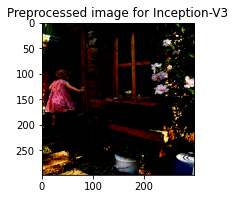

In [94]:
img = image_preprocessing('E:/All Docs/Masters/CSP 571 Data Prep and Analysis/Project/Data/8k/Flicker8k_Dataset/1000268201_693b08cb0e.jpg')

## Model

### Importing the InceptionV3 Model 

In [96]:
inception = keras.applications.inception_v3.InceptionV3(weights='imagenet')
model_1 = keras.models.Model(inputs=inception.input, outputs=inception.layers[-2].output)

### Creating Training and Testing Image paths

In [20]:
train_images_paths = []
for i in train_images:
    train_images_paths.append(f'{images_path}{i}.jpg')

In [22]:
test_images_paths = []
for i in test_images:
    test_images_paths.append(f'{images_path}{i}.jpg')

### Encoding Images

In [97]:
def image_encode(image):
    image = image_preprocessing(image)
    features = model_1.predict(image)
    features = features.reshape(features.shape[1], )
    return features

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


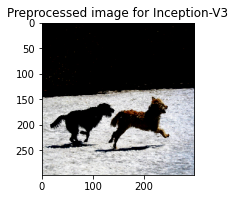

In [98]:
a = image_encode(train_images_paths[0])

In [99]:
len(a)

2048

### Encoding Train Images

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

** Time taken for encoding train images 1.7288079261779785 seconds **


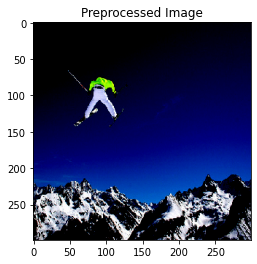

In [32]:
    t = time()
    encoded_train_images = {}
    for index, image in enumerate(train_images_paths):
        encoded_train_images[image] = image_encode(image)
        if((index) % 200 == 0):
            print(f'Completed Encoding {index + 1} images')
    print(f'Time taken {time()-t}')

### Encoding Test Images

In [ ]:
t = time()
encoded_test_images = {}
for index, image in enumerate(test_images_paths):
    encoded_test_images[image] = image_encode(image)
    if((index) % 200 == 0):
        print(f'Completed Encoding {index + 1} images')
print(f'Time taken {time()-t}')

### Saving the Encoded Images to a File

In [ ]:
with open("encoded_train_images.pkl", "wb") as encoded_pickle:
    dump(encoded_train_images, encoded_pickle)
    
with open("encoded_test_images.pkl", "wb") as encoded_pickle:
    dump(encoded_test_images, encoded_pickle)

### Creating Training Captions List

In [35]:
training_captions_list = []
for key in training_data.keys():
    for cap in training_data[key]:
        training_captions_list.append(cap)

### Creating Testing Captions List

In [37]:
testing_captions_list = []
for key in testing_data.keys():
    for cap in testing_data[key]:
        testing_captions_list.append(cap)

In [45]:
train_word_corpus = []
for cap in training_captions_list:
    for word in cap.split():
        train_word_corpus.append(word)
train_corpus_counter = Counter(train_word_corpus)
train_corpus = [word for word, count in train_corpus_counter.items() if count >= 10]

In [47]:
test_word_corpus = []
for cap in testing_captions_list:
    for word in cap.split():
        test_word_corpus.append(word)
test_corpus_counter = Counter(test_word_corpus)
test_corpus = [word for word, count in test_corpus_counter.items() if count >= 10]

### Calculating Maximum Length of all captions

In [49]:
maximum_length_caption = 0
for caption in training_captions_list:
    temp_len = len(caption.split())
    if temp_len > maximum_length_caption:
        maximum_length_caption = temp_len

### Creating Word and Index maps

In [127]:
word_dict = {}
index_dict = {}
    
for index, word in enumerate(train_corpus):
    word_dict[index+1] = word
    index_dict[word] = index+1

In [54]:
train_corpus_size = len(word_dict) + 1

### Creating Data Generator for Model Training

In [82]:
def generator_training(image_captions, image_features, index_dict, maximum_length_of_caption, pics_per_batch):
    a = list()
    b = list()
    c = list()
    counter = 0
    while True:
        for image, captions in image_captions.items():
            counter += 1
            img = f'{images_path}{image}.jpg'
            features = image_features[img]
            for caption in captions:
                sequence = [index_dict[word] for word in caption.split(' ') if word in index_dict]
                for i in range(len(sequence)):
                    s1 = sequence[:i]
                    s1 = pad_sequences([s1], maxlen=maximum_length_of_caption)[0]
                    s2 = sequence[i]
                    s2 = to_categorical([s2], num_classes=train_corpus_size)[0]
                    c.append(s2)
                    b.append(s1)
                    a.append(features)
            if counter == pics_per_batch:
                counter = 0
                a = array(a)
                b = array(b)
                c = array(c)
                yield(([a, b], c))
                a = list()
                b = list()
                c = list()

### Loading GloVe

In [51]:
weights = {}
with open('E:/All Docs/Masters/CSP 571 Data Prep and Analysis/Project/Data/glove.6B.200d.txt', encoding="utf-8") as file:
    for line in file:
        weight = line.split()
        word = weight[0]
        wts = np.asarray(weight[1:], dtype='float32')
        weights[word] = wts   

In [58]:
weights_dimension = 200

In [60]:
weight_matrix = np.zeros((train_corpus_size, weights_dimension))
for word, index in index_dict.items():
    if word in weights:
        weight_matrix[index] = weights[word]

### Model Creation

In [100]:
input_1 = keras.Input(shape=(2048,))
image_layer_1 = keras.layers.Dropout(0.5)(input_1)
inputs_2 = keras.Input(shape=(maximum_length_caption,))
caption_layer_1 = keras.layers.Embedding(train_corpus_size, weights_dimension, mask_zero=True)(inputs_2)
caption_layer_2 = keras.layers.Dropout(0.5)(caption_layer_1)
image_layer_2 = keras.layers.Dense(256, activation='relu')(image_layer_1)
caption_layer_3 = keras.layers.LSTM(256)(caption_layer_2)
decoder = keras.layers.merge.add([image_layer_2, caption_layer_3])
fully_connected_layer = keras.layers.Dense(256, activation='relu')(decoder)
fully_connected_layer_2 = keras.layers.Dense(train_corpus_size, activation='softmax')(fully_connected_layer)
model = keras.models.Model(inputs=[input_1, inputs_2], outputs=fully_connected_layer_2)
model.summary()

Model: "functional_7"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_9 (InputLayer)            [(None, 33)]         0                                            
__________________________________________________________________________________________________
input_8 (InputLayer)            [(None, 2048)]       0                                            
__________________________________________________________________________________________________
embedding_2 (Embedding)         (None, 33, 200)      328800      input_9[0][0]                    
__________________________________________________________________________________________________
dropout_4 (Dropout)             (None, 2048)         0           input_8[0][0]                    
_______________________________________________________________________________________

### Assigning weights to the Model 

In [101]:
model.layers[2].trainable = False
model.layers[2].set_weights([weight_matrix])

### Compiling the Model

In [102]:
model.compile(loss='categorical_crossentropy', optimizer='adam')

### Training the Model

In [114]:
batch_size = 3
epochs = 1
steps = len(training_data) // batch_size
training_features = load(open("encoded_train_images.pkl", "rb"))
for i in range(epochs):
    train_generator = generator_training(training_data, training_features, index_dict, maximum_length_caption, batch_size)
    trainig = model.fit_generator(train_generator, epochs=2, steps_per_epoch=steps, verbose=1)
    model.save(f'{model_path}model_{str(i)}.h5')

Epoch 1/2
2000/2000 [==============================] - 287s 143ms/step - loss: 2.1580
Epoch 2/2
2000/2000 [==============================] - 267s 134ms/step - loss: 2.0817


In [ ]:
model.optimizer.lr = 0.0001
batch_size = 6
epochs = 30
steps = len(training_data) // batch_size
for i in range(epochs):
    train_generator = generator_training(training_data, training_features, index_dict, maximum_length_caption, batch_size)
    trainig = model.fit_generator(train_generator, epochs=2, steps_per_epoch=steps, verbose=1)
    model.save(f'{model_path}model_{str(30+i)}.h5')

### Saving the Model

In [69]:
# model.save_weights(f'{model_path}model_{str(100)}.h5')

### Loading the Model

In [103]:
model.load_weights(f'{model_path}model_{str(100)}.h5')

In [131]:
def caption_generator(image):
    start = 'startseq'
    for i in range(maximum_length_caption):
        word_sequence = [index_dict[word] for word in start.split() if word in index_dict]
        word_sequence = pad_sequences([word_sequence], maxlen=maximum_length_caption)
        wts = model.predict([image,word_sequence], verbose=0)
        index = np.argmax(wts)
        word = word_dict[index]
        start += ' ' + word
        if word == 'endseq':
            break
    return ' '.join(start.split()[1:-1])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


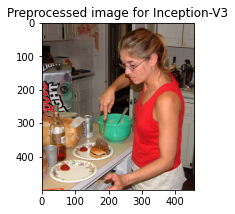

Greedy: woman in pink shirt is sitting next to man in black shirt


In [133]:
pic = "E:/All Docs/Masters/CSP 571 Data Prep and Analysis/Project/Python/Image-Captioning-master/images/112245524.jpg"
# print(pic)
pic1 = image_encode(pic)
image = pic1.reshape((1,2048))
# image = encoding_test[pic].reshape((1,2048))
x=plt.imread(pic)
plt.imshow(x)
plt.show()
out = caption_generator(image)
print("Greedy:",out)

In [113]:
maximum_length_caption

33

### Model Evaluation

In [143]:
def evaluate(captions, obtaind_op):
    c1 = []
    c2 = obtaind_op.split()
    for i in captions:
        c1.append(i.split())
    max_len = len(max(c1, key=len))
    for i in c1:
        i += [' '] * (max_len - len(i))
    c2 += [' '] * (max_len - len(c2))
    me = nltk.translate.meteor_score.meteor_score(captions, obtaind_op)
    bl = nltk.translate.bleu_score.sentence_bleu(c1, c2)
    return me, bl

### Testing the Model

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


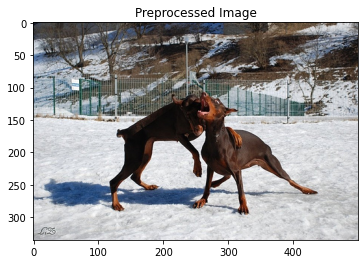

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: two dogs are wrestling in the snow


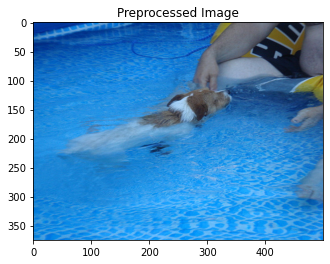

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: two girls are playing in the water


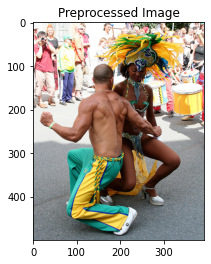

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: woman in string uniform is walking along the street


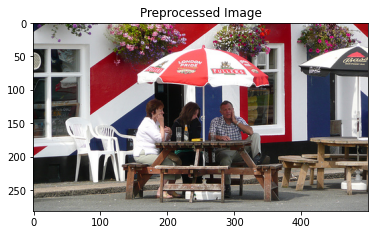

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: two girls are sitting on park bench


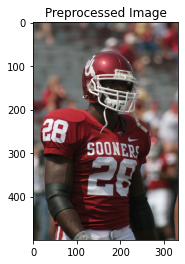

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: football player in red uniform is running down the field


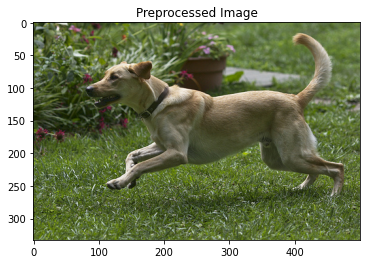

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: dog is running through the grass


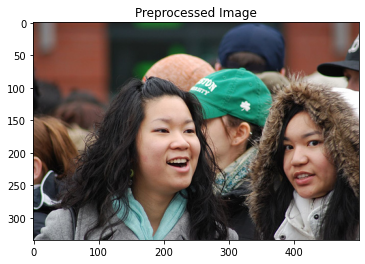

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: two women in identical costumes are posing for picture


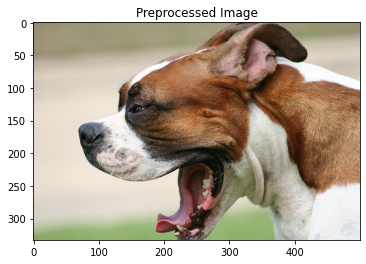

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: dog is running through the grass


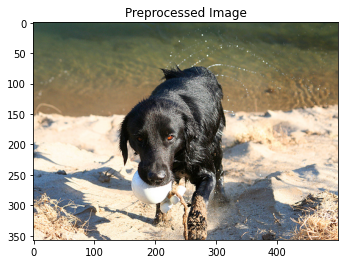

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: black dog is running through the snow


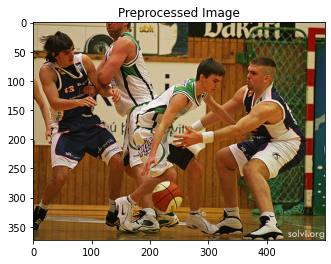

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: the opposing team are competing in the basketball court


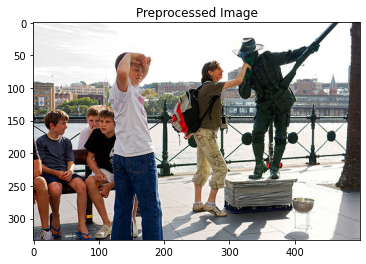

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in black jacket is standing next to large fountain


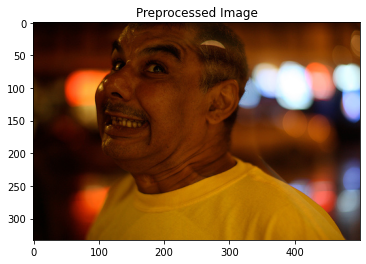

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in shirt and glasses is talking to man wearing red hat


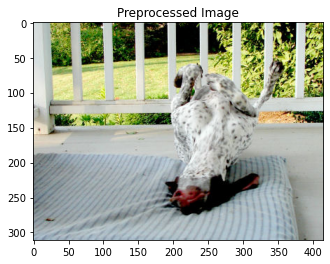

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: two dogs are shown on each side of tank


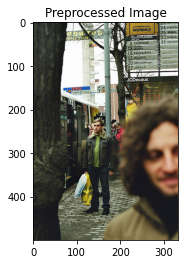

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in black jacket and tie is standing next to woman in black jacket


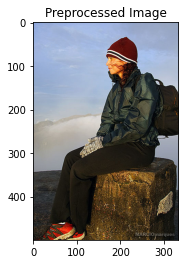

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in red shirt is standing on top of mountain


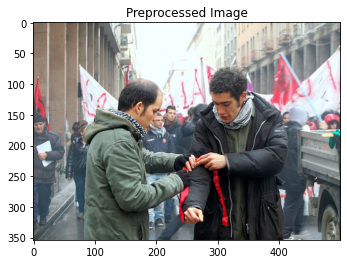

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in black jacket is standing outside of shop


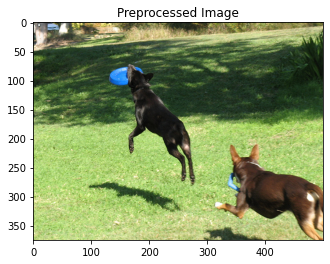

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: black dog is running through the grass


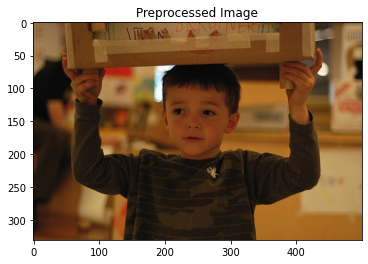

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in black shirt is sitting on chair with his dog


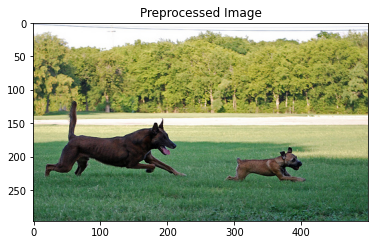

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: two dogs are playing together in the grass


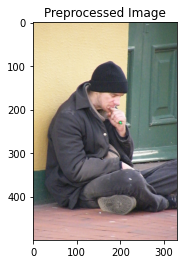

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in black jacket is sitting on the ground reading book


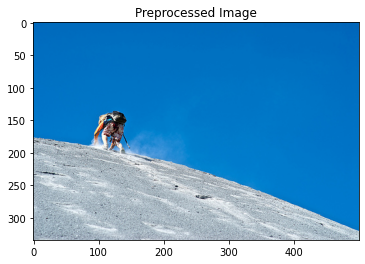

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man is standing on snowcapped mountain looking at the mountains surrounding him


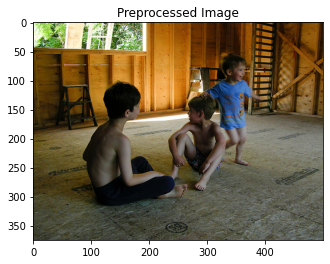

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: two girls are sitting on bed in front of the door


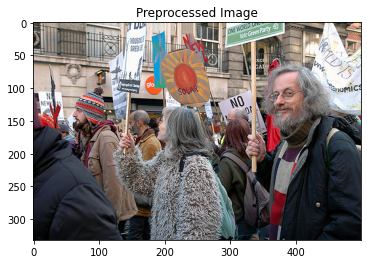

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in black jacket waves cigarette in crowd of people


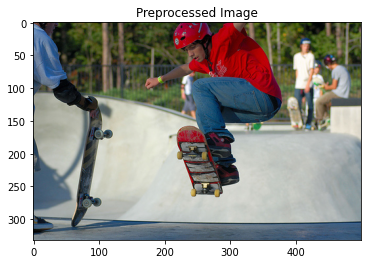

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: two children are playing on tire


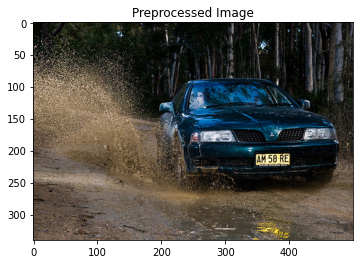

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in red shirt is pulling cart on the beach


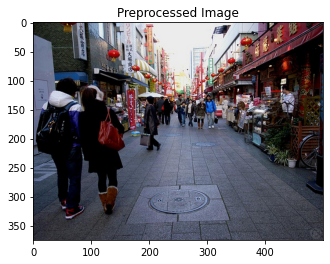

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: people walking along the street seen some are walking past


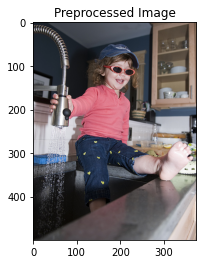

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in black jacket is eating


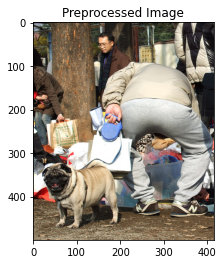

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in black shirt is eating piece of


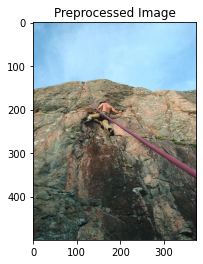

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man is climbing up huge boulder


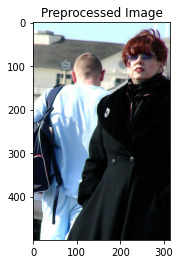

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in black shirt and sunglasses is smiling


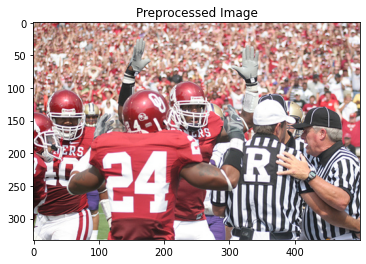

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: football players huddle


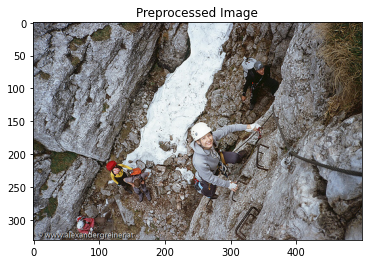

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in red climbs sheer cliff face


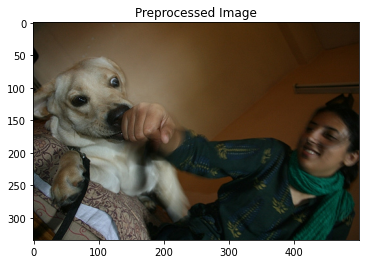

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: dog is running through doorway leading


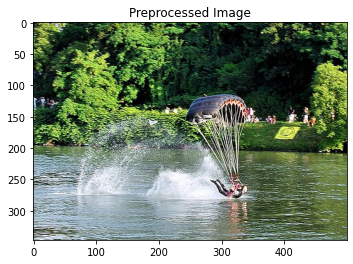

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in red shirt is attached to rope whilst camping


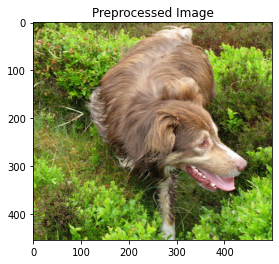

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: dog is running through the grass


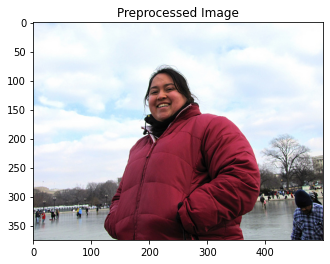

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in red shirt and jeans follows


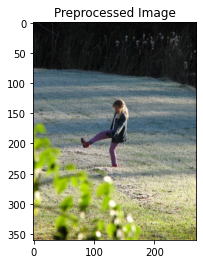

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: two boys are playing with fallen football in the grass


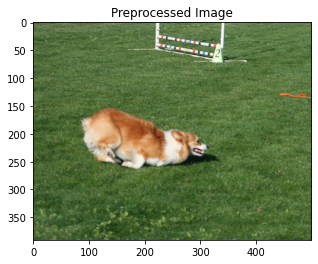

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: dog is running through the grass


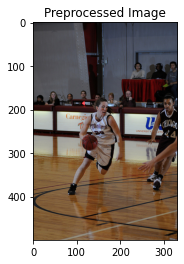

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: two men are playing basketball on court


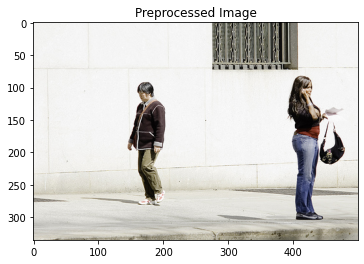

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: woman in black and white dress is walking across the street


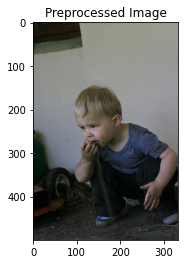

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: baby in red shirt is sitting on wooden bench


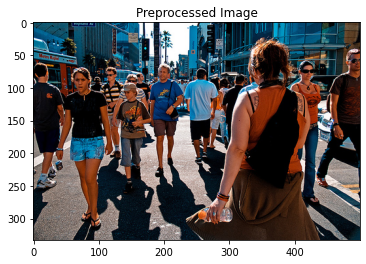

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: group of people stand in front of large crowd


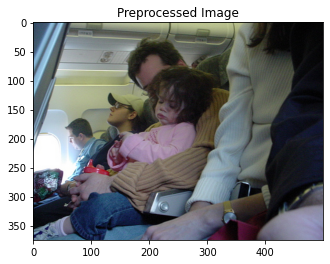

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: two girls lay on bed


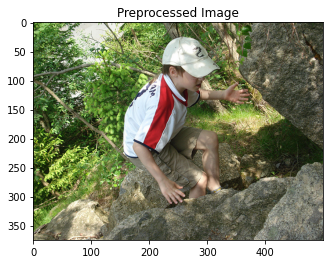

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in red shirt is climbing up rock


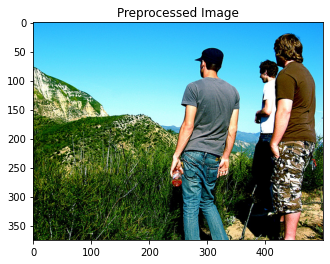

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in red shirt is standing on rock looking at the view


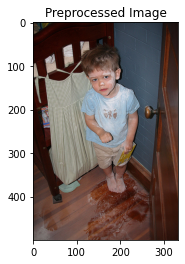

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: baby in red pajamas plays with toy


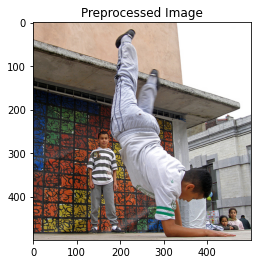

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: boy in red shirt is jumping off of bar


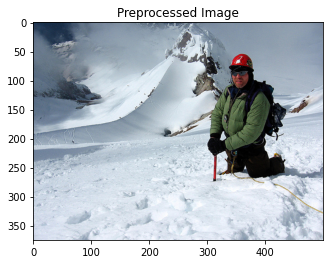

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in red skiing gear facing down snowy hill


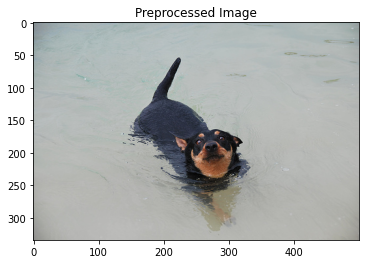

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: two dogs play in the water


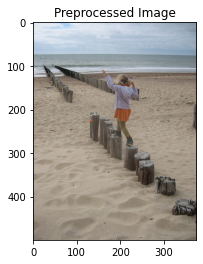

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: two people are walking along the beach near the ocean


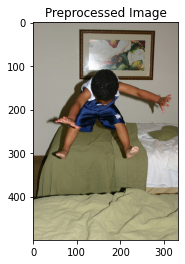

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: two girls are sitting on bed in front of the window


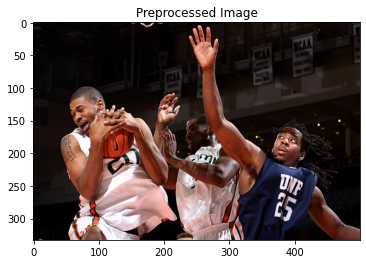

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: two men are playing basketball


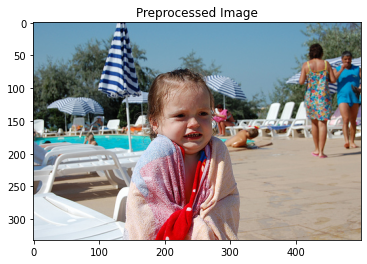

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: young boy wearing red shirt is playing in the water


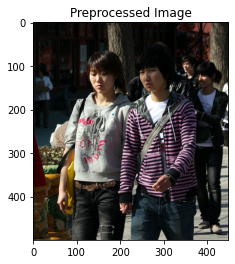

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: woman in black and white print jacket is standing next to two other people standing by table


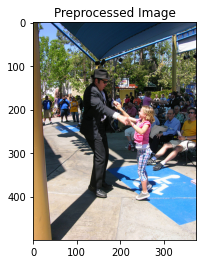

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in black shirt is standing onstage


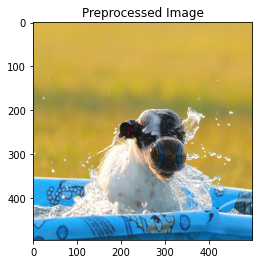

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: dog swims through the water


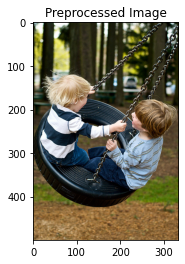

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: young boy wearing red shirt is swinging on swing


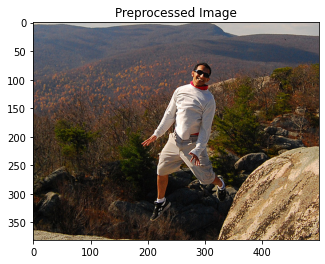

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in red shirt is standing on rock looking out at the sunset


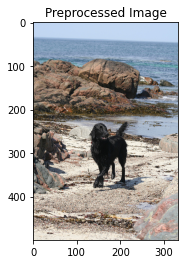

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: black dog is walking along the beach


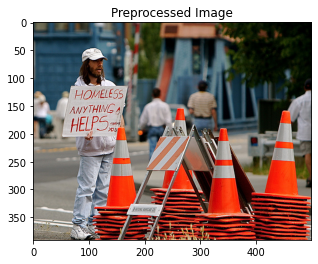

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in black coat is standing in front of an machine


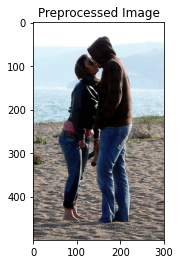

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in black jacket is standing on rock overlooking the water


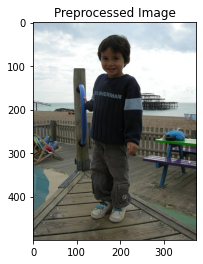

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in black jacket is sitting on wooden bench


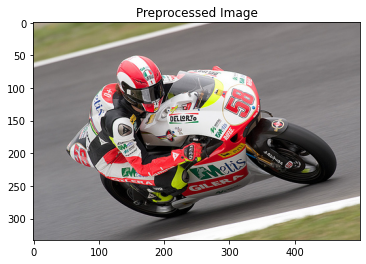

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in red uniform is riding red motorbike


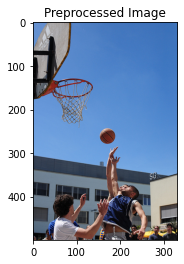

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: two men are playing basketball on court


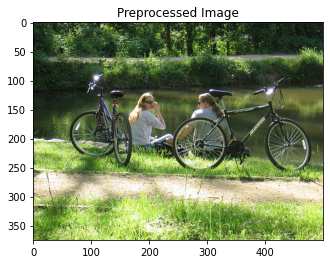

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in red shirt and jeans follows uphill on fancy bike


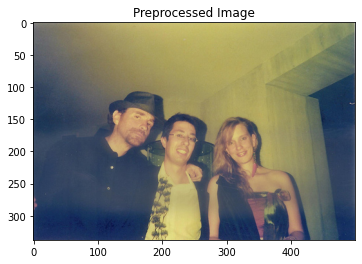

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: two girls are sitting in front of bus


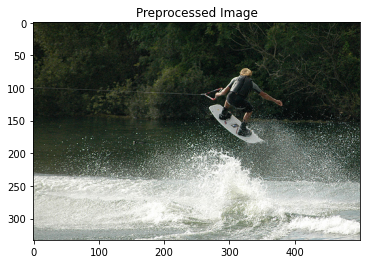

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in black shirt and knee is standing on the shore


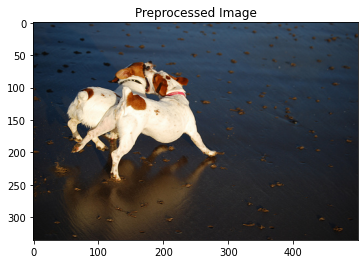

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: two white and brown poodles are playing on the sand


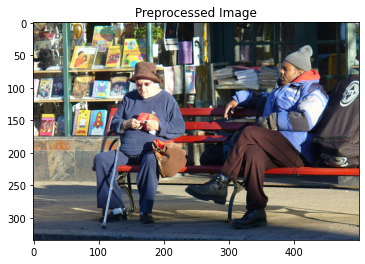

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in black jacket is standing outside smoking cigarette


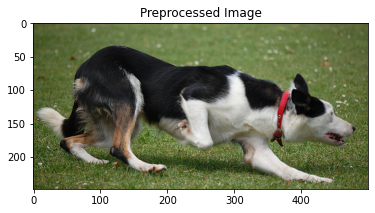

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: black and white dog is running through the grass


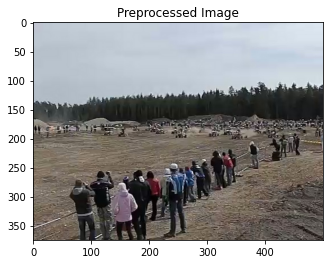

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in red jacket is walking along rocky path


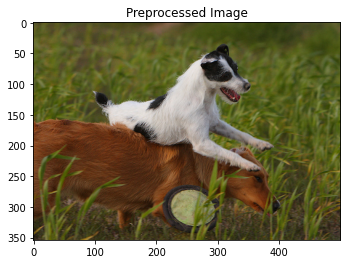

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: two dogs are playing together on the grass


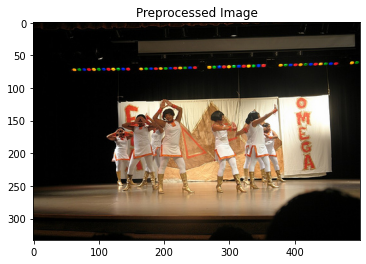

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: group of children are lined in line of an adults


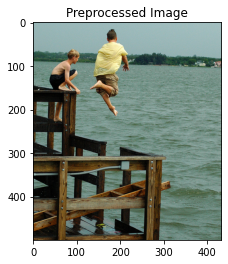

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: two people are fishing on the end of the water


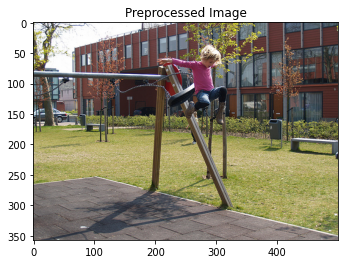

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: boy in striped shirt is jumping off of playground equipment


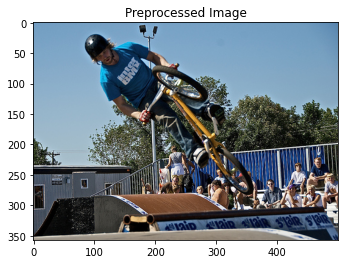

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in black shirt is doing stunt on bike


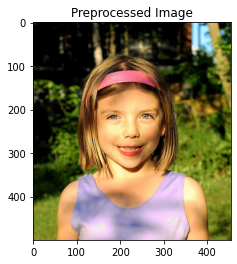

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: boy in red shirt and black shorts is smiling whilst looking away from the camera


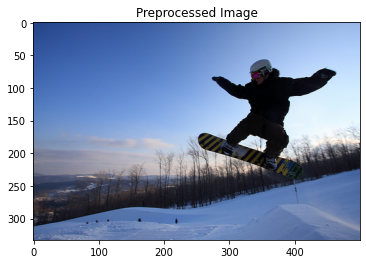

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in red jacket is snowboarding down snowy hill


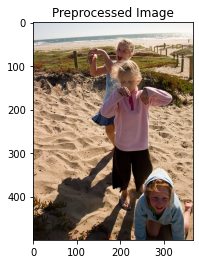

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: boy in red shirt is running through water


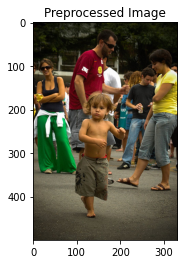

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: two girls are doing handstand on trampoline


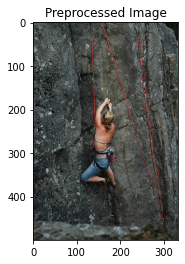

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in red shirt climbs rock cliff


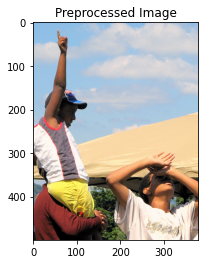

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: two men lift their arms as they are sitting on the ground


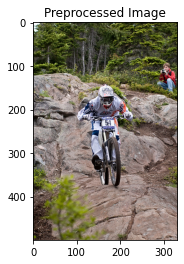

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in red uniform is riding bike down dirt hill


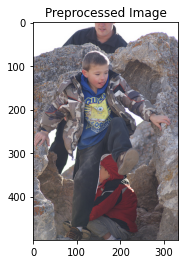

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in red shirt climbs sheer cliff face


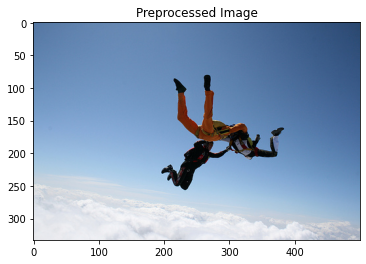

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man is climbing up cliff


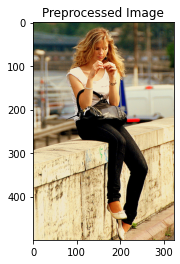

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: girl in pink shirt and jean shorts makeup watches


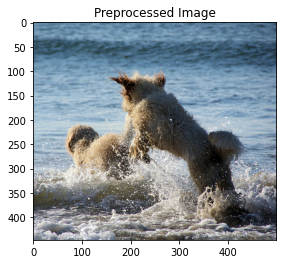

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: dog runs through the water


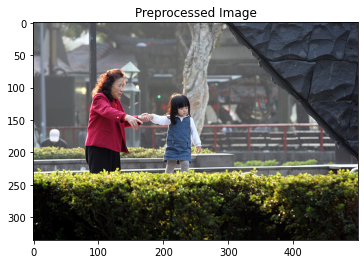

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in black shirt is standing next to statue


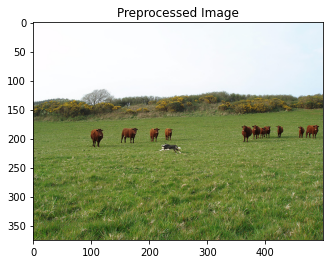

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: two dogs are playing together on the grass


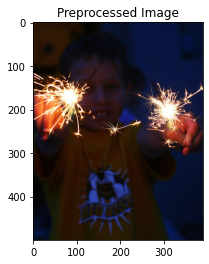

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in plaid shirt is eating piece of


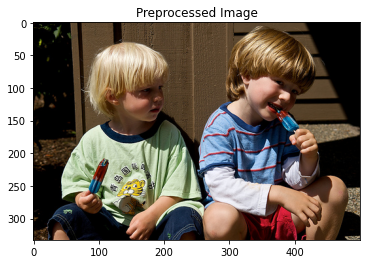

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: woman in pink shirt is eating with blonde girl in shirt


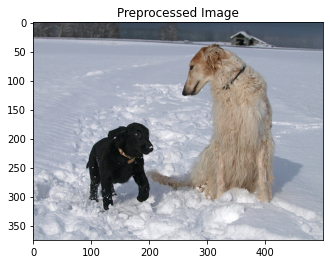

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: two dogs play in the snow


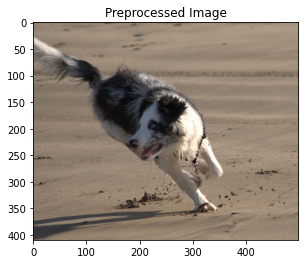

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: black and white dog is running through the water


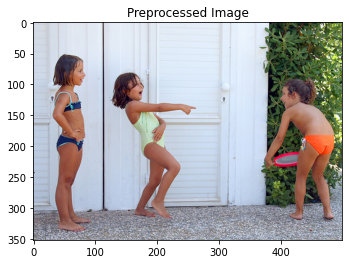

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: woman in skimpy bikini is throwing her wet into the air


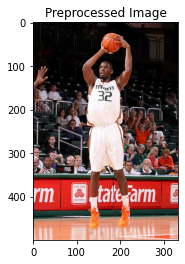

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: two men in gym outfits are playing


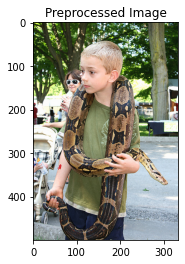

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in black shirt is helping child on his back in the seat


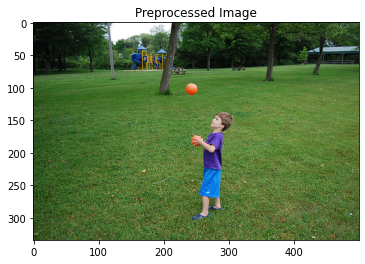

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: young boy is running on the grass with his arms in the air


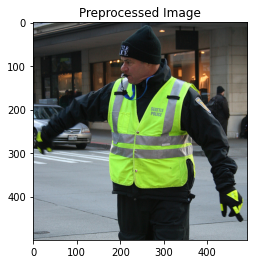

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in black jacket and tie hat stands in front of roller coaster


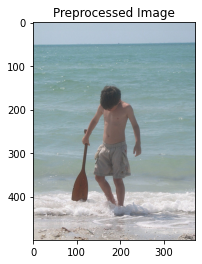

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: man in black shirt is riding surfboard on the beach


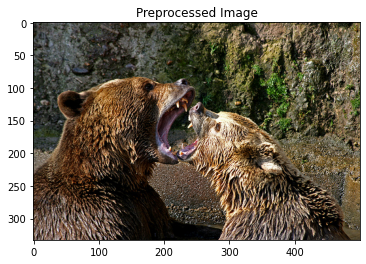

Greedy: dog is licking its nose


In [161]:
opt = []
for i in range(100):
    pic = test_images_paths[i]
    pic1 = image_encode(pic)
    image = pic1.reshape((1,2048))
    x=plt.imread(pic)
    plt.imshow(x)
    plt.show()
    out = caption_generator(image)
    print("Greedy:",out)
    captions = testing_data[str(pic[85:-4])]
#     print('a', captions)
    opt.append(evaluate(captions, out))

In [164]:
opt2 = []
for i in opt:
    opt2.append(i[0])
opt3 = []
for i in opt:
    opt3.append(i[1])

### Displaying the results/Captions

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


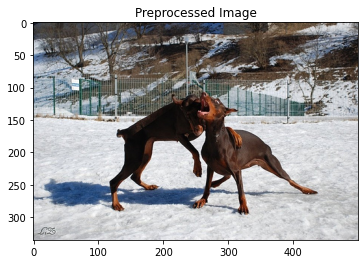

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: two dogs are wrestling in the snow


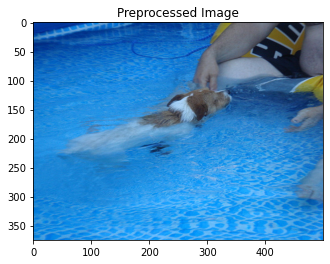

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: two girls are playing in the water


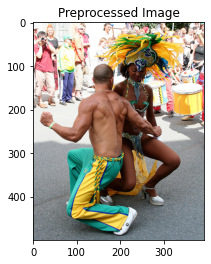

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: woman in string uniform is walking along the street


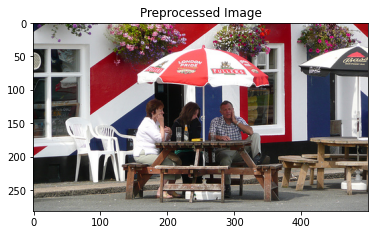

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: two girls are sitting on park bench


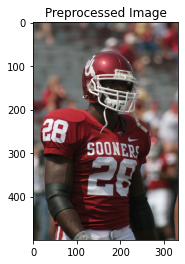

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: football player in red uniform is running down the field


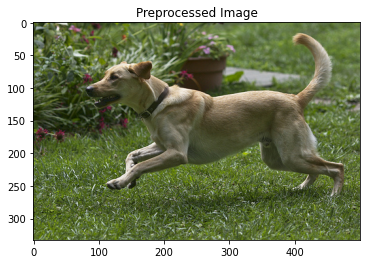

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: dog is running through the grass


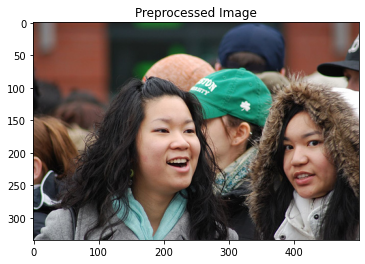

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: two women in identical costumes are posing for picture


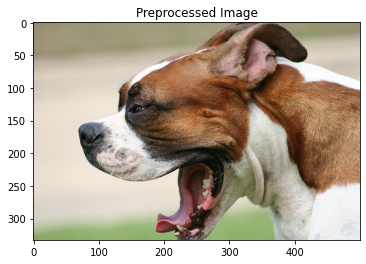

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: dog is running through the grass


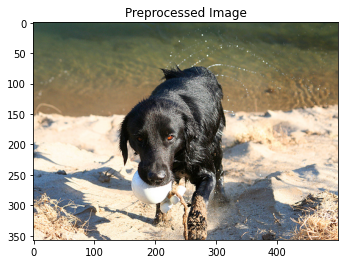

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Greedy: black dog is running through the snow


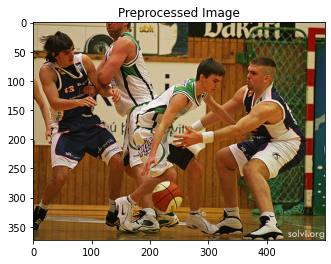

Greedy: the opposing team are competing in the basketball court


In [158]:
opt = []
for i in range(10):
    pic = test_images_paths[i]
    pic1 = image_encode(pic)
    image = pic1.reshape((1,2048))
    x=plt.imread(pic)
    plt.imshow(x)
    plt.show()
    out = caption_generator(image)
    print("Greedy:",out)
    captions = testing_data[str(pic[85:-4])]
#     print('a', captions)
    opt.append(evaluate(captions, out))

In [160]:
b_score = sum(opt3) / float(len(opt3))
print(f'Average Bleu Score for the model is - {b_score}')

Average Bleu Score for the model is - 0.41089122809839507
